In [1]:
import osmnx
import folium
import networkx
import statistics

In [2]:
graph = osmnx.graph_from_place("Yoyogi Park, Shibuya, Tokyo, Japan")

In [3]:
osmnx.save_graphml(graph, "yoyogi_park_graph.graphml")

In [4]:
graph = osmnx.load_graphml("yoyogi_park_graph.graphml")

In [5]:
type(graph)

networkx.classes.multidigraph.MultiDiGraph

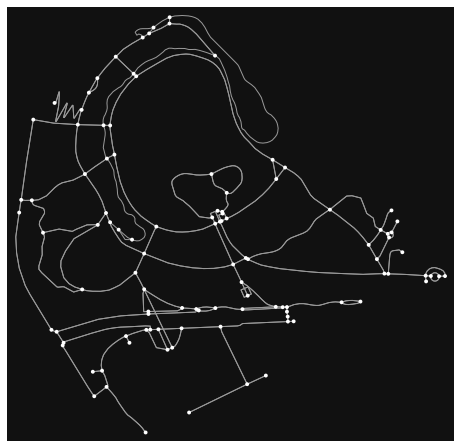

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [6]:
osmnx.plot_graph(graph)

In [7]:
len(graph.nodes)
len(graph.edges)
graph.nodes[1520546819]
graph.edges[(1520546819, 3010293622, 0)]

{'osmid': 138670840,
 'highway': 'footway',
 'oneway': False,
 'length': 59.113,
 'geometry': <shapely.geometry.linestring.LineString at 0x7ffc5f0ad4c0>}

In [8]:
len(graph.edges)

287

In [9]:
graph.nodes[1520546819]

{'y': 35.6711267, 'x': 139.6925951, 'street_count': 4}

In [10]:
graph.edges[(1520546819, 3010293622, 0)]

{'osmid': 138670840,
 'highway': 'footway',
 'oneway': False,
 'length': 59.113,
 'geometry': <shapely.geometry.linestring.LineString at 0x7ffc5f0ad4c0>}

In [11]:
deventer_graph = osmnx.graph_from_place("Deventer, Netherlands", network_type="drive")
osmnx.save_graphml(deventer_graph, "deventer_graph.graphml")

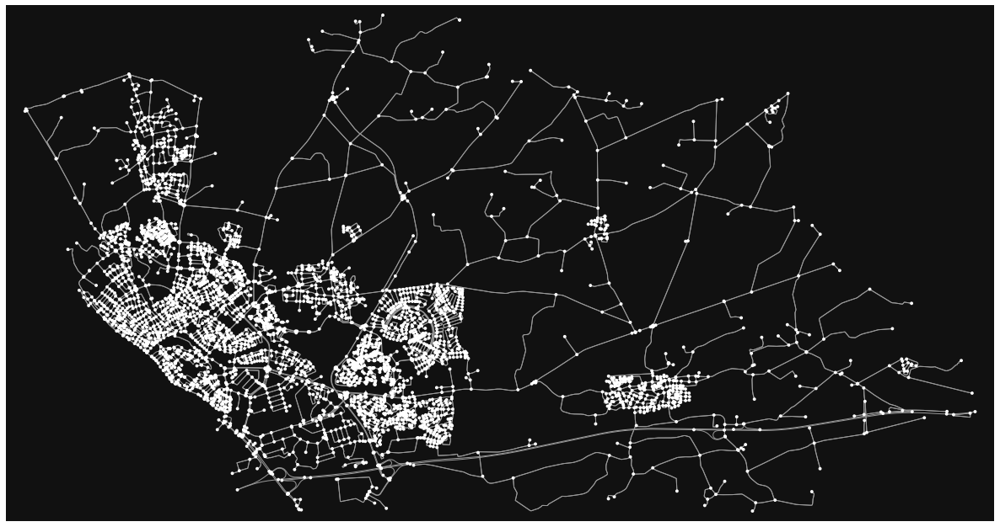

(<Figure size 1512x1512 with 1 Axes>, <AxesSubplot:>)

In [12]:
deventer_graph = osmnx.load_graphml("deventer_graph.graphml")
osmnx.plot_graph(deventer_graph, figsize=(21, 21))

In [13]:
m = folium.Map(location=[52.248061, 6.244875], zoom_start=12)
m

In [14]:
osmnx.folium.plot_graph_folium(deventer_graph, popup_attribute='name', tiles="cartodbpositron", weight=2)

In [15]:
colmschate_graph = osmnx.graph_from_place("Colmschate, Deventer, Netherlands")
osmnx.save_graphml(colmschate_graph, "colmschate_graph.graphml")

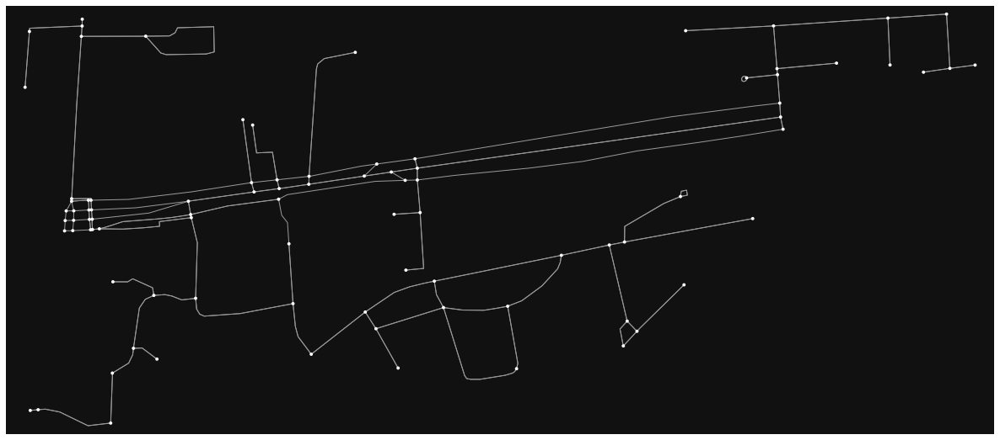

(<Figure size 1512x1512 with 1 Axes>, <AxesSubplot:>)

In [16]:
colmschate_graph = osmnx.load_graphml("colmschate_graph.graphml")
osmnx.plot_graph(colmschate_graph, figsize=(21, 21))

In [17]:
osmnx.plot_graph_folium(colmschate_graph, popup_attribute='name', weight=2)

In [18]:
orig_node = osmnx.distance.nearest_nodes(
    G=deventer_graph,
    X=6.16412429782571,
    Y=52.2696953029959)
target_node = osmnx.distance.nearest_nodes(
    G=deventer_graph,
    X=6.16551000277247,
    Y=52.2719209188987)
length = networkx.shortest_path_length(G=deventer_graph, source=orig_node, target=target_node, weight='length')
print(length)

392.32800000000003


In [19]:
node_list = osmnx.distance.nearest_nodes(
    G=deventer_graph,
    X=[6.16412429782571, 6.16551000277247],
    Y=[52.2696953029959, 52.2719209188987]
)
length = networkx.shortest_path_length(G=deventer_graph, source=node_list[0], target=node_list[1], weight='travel_time')
print(length)

7


In [20]:
node_list = osmnx.distance.nearest_nodes(
    G=deventer_graph,
    X=[6.16412429782571, 6.16551000277247],
    Y=[52.2696953029959, 52.2719209188987],
    return_dist=True
)
print(node_list)

([3623011952, 3623011991], [47.608892142647996, 64.76852919997441])


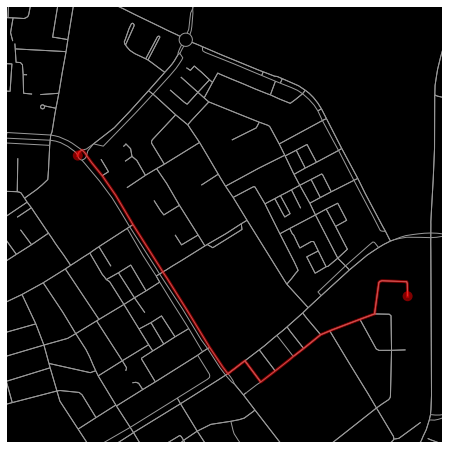

In [21]:
orig = [6.175028, 52.267494]
dest = [6.163886, 52.269838]
node_list = osmnx.distance.nearest_nodes(
    G=deventer_graph,
    X=[orig[0], dest[0]],
    Y=[orig[1], dest[1]]
)
mid = [statistics.mean([orig[0], dest[0]]), statistics.mean([orig[1], dest[1]])]
route = networkx.shortest_path(deventer_graph, node_list[0], node_list[1])
bbox = osmnx.utils_geo.bbox_from_point((mid[1], mid[0]), dist=500)
fig, ax = osmnx.plot_graph_route(deventer_graph, route, bbox=bbox, route_linewidth=3, node_size=0, bgcolor='k')

In [22]:
length = networkx.shortest_path_length(G=deventer_graph, source=node_list[0], target=node_list[1], weight='length')
time = networkx.shortest_path_length(G=deventer_graph, source=node_list[0], target=node_list[1], weight='travel_time')
print(f'length: {length}, time: {time}')

length: 1214.4309999999998, time: 17


![](map1.png)

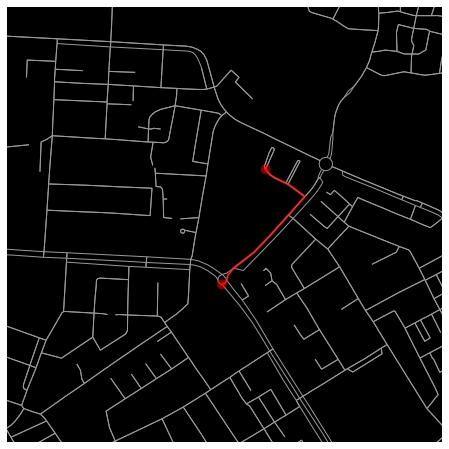

In [23]:
orig = [6.16412429782571, 52.2696953029959]
dest = [6.16532406198843, 52.2727779369468]
node_list = osmnx.distance.nearest_nodes(
    G=deventer_graph,
    X=[orig[0], dest[0]],
    Y=[orig[1], dest[1]]
)
mid = [statistics.mean([orig[0], dest[0]]), statistics.mean([orig[1], dest[1]])]
route = networkx.shortest_path(deventer_graph, node_list[0], node_list[1])
bbox = osmnx.utils_geo.bbox_from_point((mid[1], mid[0]), dist=500)
fig, ax = osmnx.plot_graph_route(deventer_graph, route, bbox=bbox, route_linewidth=3, node_size=0, bgcolor='k')

In [24]:
length = networkx.shortest_path_length(G=deventer_graph, source=node_list[0], target=node_list[1], weight='length')
time = networkx.shortest_path_length(G=deventer_graph, source=node_list[0], target=node_list[1], weight='travel_time')
print(f'length: {length}, time: {time}')

length: 392.32800000000003, time: 7


![](map2.png)